***Install Dependencies***

In [1]:
!nvidia-smi

Sat Feb 21 04:49:13 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A100-SXM4-80GB          Off |   00000000:00:05.0 Off |                    0 |
| N/A   35C    P0             57W /  400W |       0MiB /  81920MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 17822, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (22/22), done.
remote: Total 17822 (delta 15), reused 6 (delta 6), pack-reused 17794 (from 3)
Receiving objects: 100% (17822/17822), 16.96 MiB | 37.67 MiB/s, done.
Resolving deltas: 100% (12141/12141), done.
/content/yolov5


In [3]:
!pip install -qr requirements.txt

import torch
from IPython.display import Image, clear_output

clear_output()

if torch.cuda.is_available():
    device = torch.device('cuda')
    gpu_name = torch.cuda.get_device_name(0)
    print(f"Setup complete. Using torch {torch.__version__} on GPU: {gpu_name}")
else:
    device = torch.device('cpu')
    print(f"Setup complete. Using torch {torch.__version__} on CPU")

Setup complete. Using torch 2.10.0+cu128 on GPU: NVIDIA A100-SXM4-80GB


In [4]:
pwd

'/content/yolov5'

In [5]:
%cd /content

/content


In [6]:
import gdown

url = "https://drive.google.com/file/d/1PQ7v0Y7_AWMNSbGUzlXI1xkSnGQBn9hv/view?usp=sharing"

file_id = url.split("/")[-2]
print(file_id)
prefix = 'https://drive.google.com/uc?/export=download&id='
gdown.download(prefix+file_id, 'components_detection.zip')
print("Data downloaded")

1PQ7v0Y7_AWMNSbGUzlXI1xkSnGQBn9hv


Downloading...
From (original): https://drive.google.com/uc?/export=download&id=1PQ7v0Y7_AWMNSbGUzlXI1xkSnGQBn9hv
From (redirected): https://drive.google.com/uc?%2Fexport=download&id=1PQ7v0Y7_AWMNSbGUzlXI1xkSnGQBn9hv&confirm=t&uuid=cc14d7ef-cc50-4ad4-83ae-1ab0737ae8b9
To: /content/components_detection.zip
100%|██████████| 132M/132M [00:01<00:00, 122MB/s]

Data downloaded


In [7]:
!unzip components_detection.zip
!rm -rf components_detection.zip

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/train/images/._IMG_20240220_134925_jpg.rf.0de9a3082f5e795785b52c576cdc88e0.jpg  
  inflating: train/images/IMG20240306115903_jpg.rf.325fad672d4ac31c50af4536f145ffa8.jpg  
  inflating: __MACOSX/train/images/._IMG20240306115903_jpg.rf.325fad672d4ac31c50af4536f145ffa8.jpg  
  inflating: train/images/IMG_5212_JPG.rf.eaf2ccac8d35a331c041021d4c71c269.jpg  
  inflating: __MACOSX/train/images/._IMG_5212_JPG.rf.eaf2ccac8d35a331c041021d4c71c269.jpg  
  inflating: train/images/IMG_5185_JPG.rf.6815cd7b86bef9e7acbddf4c14188fe1.jpg  
  inflating: __MACOSX/train/images/._IMG_5185_JPG.rf.6815cd7b86bef9e7acbddf4c14188fe1.jpg  
  inflating: train/images/IMG_20240309_115136_jpg.rf.f3e9beebd5cba5ba3016331acce6d013.jpg  
  inflating: __MACOSX/train/images/._IMG_20240309_115136_jpg.rf.f3e9beebd5cba5ba3016331acce6d013.jpg  
  inflating: train/images/IMG20240417115028_jpg.rf.ffd40b5bf786e131b0c17db0831a9ed4.jpg  
  inflating: __MACOSX/tr

In [8]:
%cat data.yaml

# data.yaml for YOLOv8
train: ../train/images
val: ../validation/images

nc: 61
names: [
    "15VoltBattery",
    "15VoltageBattery",
    "33VoltBattery",
    "7SegmentDisplay",
    "9VoltBattery",
    "9VolteBattery",
    "ArduinoMega",
    "ArduinoNano",
    "ArduinoUno",
    "BJTTransistor",
    "BluetoothModule",
    "Breadboard",
    "BridgeRectifier",
    "BuckConverter",
    "Buzzer",
    "Capacitor10mf",
    "Capacitor470mf",
    "DCMotor",
    "Diode",
    "ESP32",
    "ESP32CAM",
    "FT232USBSerialModule",
    "FilmCapacitor",
    "Fuse",
    "FuseBase",
    "GSMModule",
    "GasSensor",
    "HeatSink",
    "HighVoltageCeramicCapacitor",
    "HighVoltageCeramicCpacitor",
    "HumiditySensor",
    "ICBase14Pin",
    "ICBase28Pin",
    "ICChip",
    "IGBT",
    "IRSensor",
    "Inductor",
    "Keypad",
    "LCDDisplay",
    "LDRSensor",
    "LEDLight",
    "LowVoltageCeramicCapacitor",
    "MLCCapacitor",
    "MOSFET",
    "MotionSensor",
    "MotorDriver",
    "NTCThermistor"

## **Defining Model Configuration and Architecture**

In [9]:
import yaml

with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

num_classes

'61'

In [10]:
%cat /content/yolov5/models/yolov5s.yaml    #Model = yolov5s

# Ultralytics 🚀 AGPL-3.0 License - https://ultralytics.com/license

# Parameters
nc: 80 # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, 

In [11]:
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [12]:
%%writetemplate /content/yolov5/models/cutsom_yolov5s.yaml


# Parameters
nc: {num_classes} # number of classes
depth_multiple: 0.33 # model depth multiple
width_multiple: 0.50 # layer channel multiple
anchors:
  - [10, 13, 16, 30, 33, 23] # P3/8
  - [30, 61, 62, 45, 59, 119] # P4/16
  - [116, 90, 156, 198, 373, 326] # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [
    [-1, 1, Conv, [64, 6, 2, 2]], # 0-P1/2
    [-1, 1, Conv, [128, 3, 2]], # 1-P2/4
    [-1, 3, C3, [128]],
    [-1, 1, Conv, [256, 3, 2]], # 3-P3/8
    [-1, 6, C3, [256]],
    [-1, 1, Conv, [512, 3, 2]], # 5-P4/16
    [-1, 9, C3, [512]],
    [-1, 1, Conv, [1024, 3, 2]], # 7-P5/32
    [-1, 3, C3, [1024]],
    [-1, 1, SPPF, [1024, 5]], # 9
  ]

# YOLOv5 v6.0 head
head: [
    [-1, 1, Conv, [512, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 6], 1, Concat, [1]], # cat backbone P4
    [-1, 3, C3, [512, False]], # 13

    [-1, 1, Conv, [256, 1, 1]],
    [-1, 1, nn.Upsample, [None, 2, "nearest"]],
    [[-1, 4], 1, Concat, [1]], # cat backbone P3
    [-1, 3, C3, [256, False]], # 17 (P3/8-small)

    [-1, 1, Conv, [256, 3, 2]],
    [[-1, 14], 1, Concat, [1]], # cat head P4
    [-1, 3, C3, [512, False]], # 20 (P4/16-medium)

    [-1, 1, Conv, [512, 3, 2]],
    [[-1, 10], 1, Concat, [1]], # cat head P5
    [-1, 3, C3, [1024, False]], # 23 (P5/32-large)

    [[17, 20, 23], 1, Detect, [nc, anchors]], # Detect(P3, P4, P5)
  ]

## **Train Custom Model Detector**

In [15]:
%%time
%cd /content/yolov5/

!python train.py --img 416 --batch 16 --epochs 50 --data '../data.yaml' --cfg ./models/cutsom_yolov5s.yaml --weights 'yolov5s.pt' --name yolov5s_results --cache

Streaming output truncated to the last 5000 lines.
      24/49      2.04G    0.03494    0.03772    0.02639        137        416:  11% 10/93 [00:00<00:05, 13.99it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      24/49      2.04G    0.03516    0.03742    0.02659        125        416:  13% 12/93 [00:00<00:05, 13.59it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      24/49      2.04G    0.03536     0.0378    0.02689        173        416:  13% 12/93 [00:00<00:05, 13.59it/s]/content/yolov5/train.py:414: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      24/49      2.04G    0.03533    

## **Evaluate Custom YOLOv5 Detector Performance**

In [16]:
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

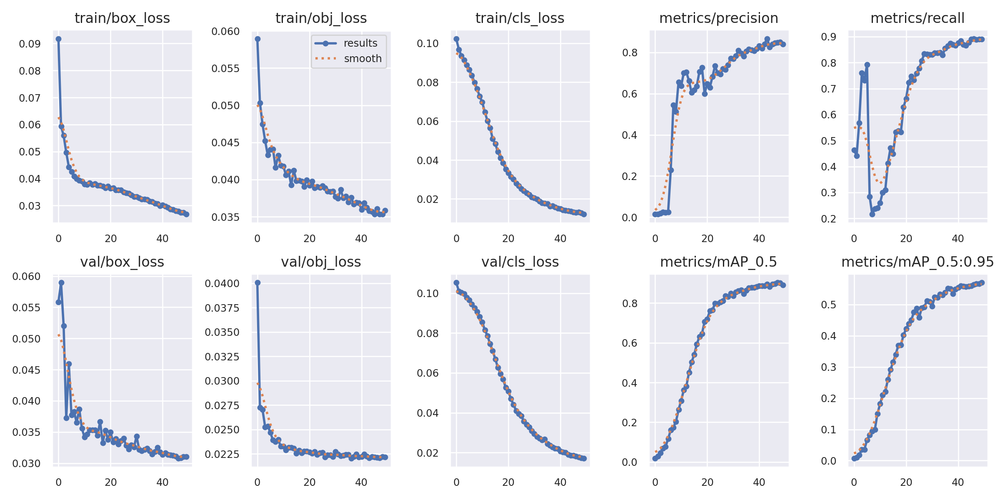

In [18]:
from utils.plots import plot_results

Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1000)

GROUND TRUTH TRAINING DATA: 


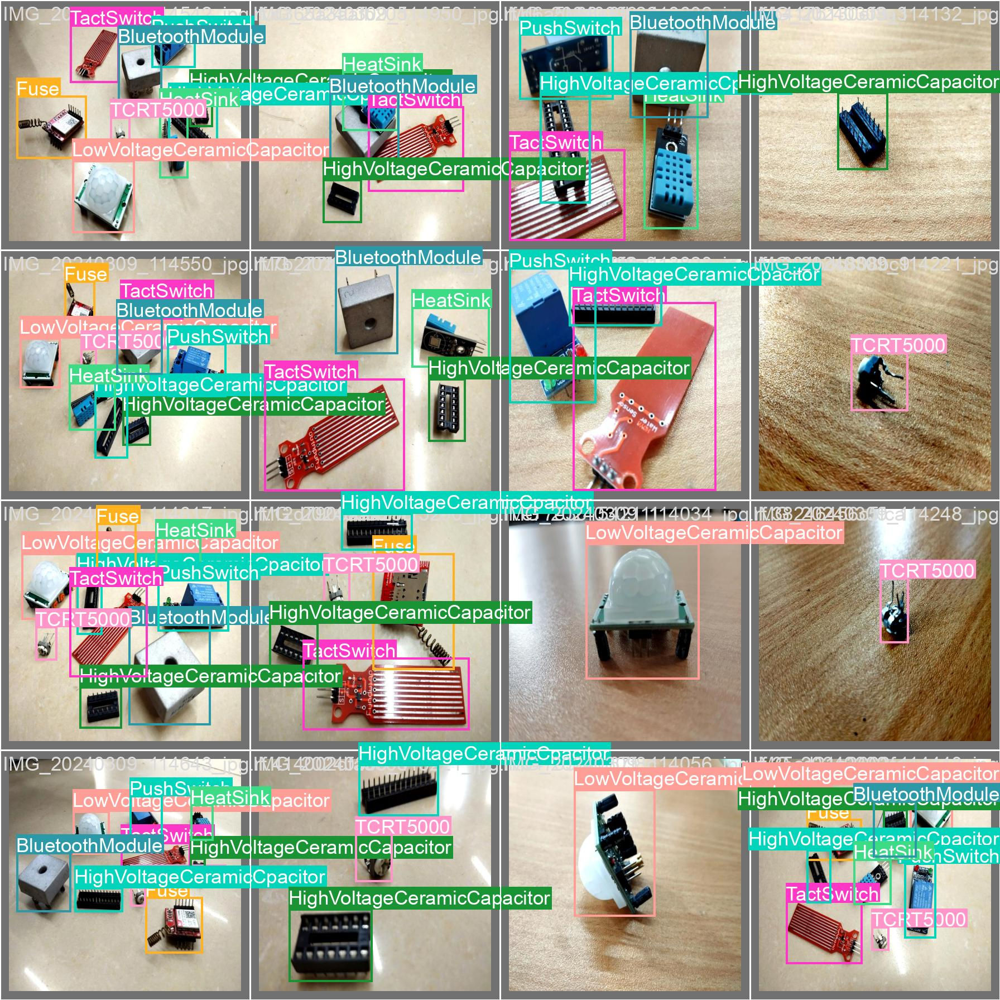

In [20]:
print("GROUND TRUTH TRAINING DATA: ")
Image(filename='/content/yolov5/runs/train/yolov5s_results/val_batch0_labels.jpg', width=900)

GROUND TRUTH AUGMENTED TRAINING DATA: 


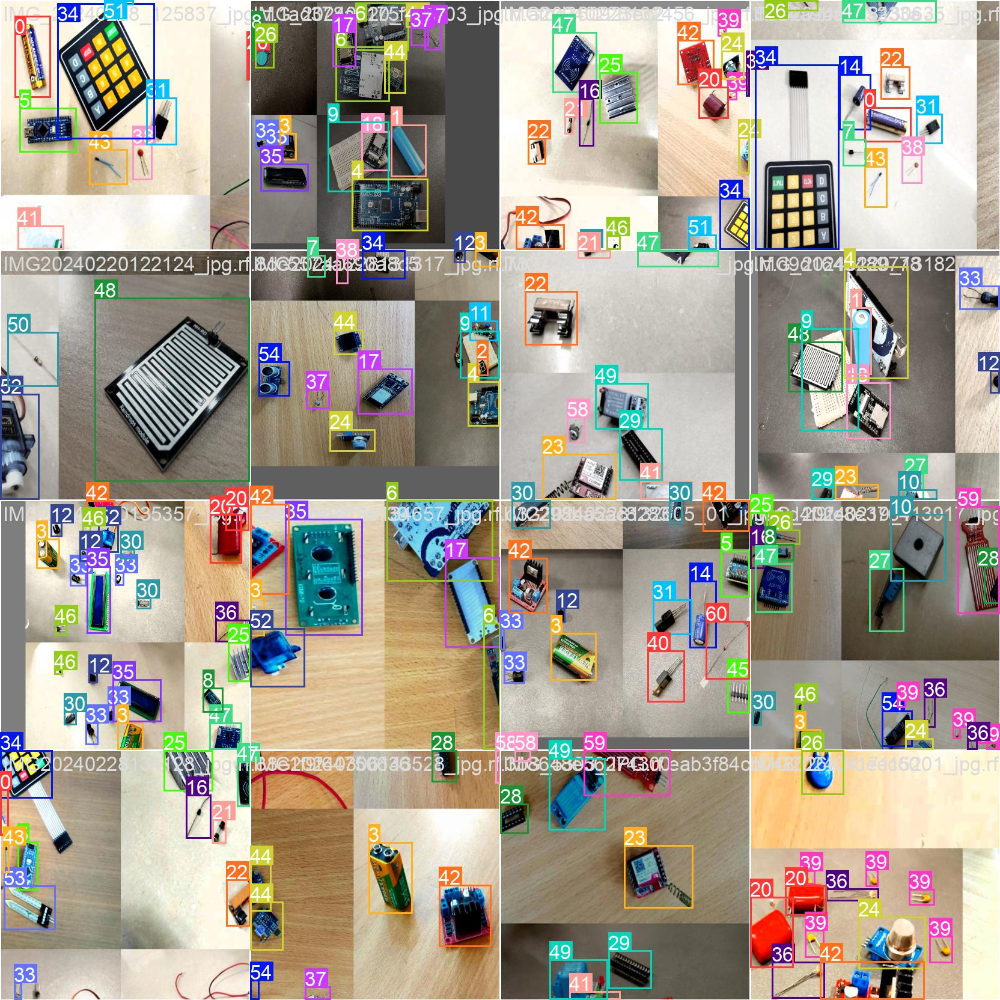

In [21]:
print("GROUND TRUTH AUGMENTED TRAINING DATA: ")
Image(filename='/content/yolov5/runs/train/yolov5s_results/train_batch0.jpg', width=900)

## Run Inference with Trained Weights

In [22]:
%ls runs/

train/


In [23]:
%ls runs/train/yolov5s_results/weights

best.pt  last.pt


In [24]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results/weights/best.pt --img 416 --conf 0.5 --source ../validation/images

/content/yolov5
detect: weights=['runs/train/yolov5s_results/weights/best.pt'], source=../validation/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-460-g3fb11111 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (NVIDIA A100-SXM4-80GB, 81153MiB)

Fusing layers... 
cutsom_YOLOv5s summary: 157 layers, 7174642 parameters, 0 gradients, 16.3 GFLOPs
image 1/438 /content/validation/images/IMG20240228122809_jpg.rf.bb184f37aa98d96f1db1ac5492b4c81c.jpg: 416x416 1 15VoltBattery, 1 9VolteBattery, 1 ArduinoNano, 1 BuckConverter, 1 Buzzer, 2 ICBase14Pins, 2 ICBase28Pins, 1 IGBT, 1 LCDDisplay, 1 LEDLight, 1 MOSFET, 1

## **Export Trained Weights for Future Inference**

In [25]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [26]:
%cp /content/yolov5/runs/train/yolov5s_results/weights/best.pt /content/drive/MyDrive/Components_Detection/